# Packages Import

In [9]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from utils.labels import map_class_to_rgb, adjust_mask
import segmentation_models as sm
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from utils.util import *
from arch.deeplabv3plus import Deeplabv3


# Paths and Constants

In [10]:
##### paths


## update data path
base_data_dir = 'original'

saved_models = 'docs_models'

train_path = os.path.join(base_data_dir, 'data')
test_path = os.path.join(base_data_dir, 'testing')

classes_path = os.path.join(base_data_dir, 'classes.csv')


iti_data_dir = os.path.join(base_data_dir, 'aroundITI')
single_frames_dir = os.path.join(base_data_dir, 'single_frames')
videos_dir = os.path.join(base_data_dir, 'videos')

output_images_dir = os.path.join(base_data_dir, 'output_images')
output_videos_dir = os.path.join(base_data_dir, 'output_videos')



## parmeters

## we may change batch_size , DIM
batch_sz =4
num_classes = 20
DIM=512
seed = 1
epoch_num=500







# Read Labels file

In [11]:
classes = pd.read_csv(classes_path,index_col='name')

# data generators

In [12]:
# Data generator
train_generator_fn, val_generator_fn, train_length, validation_length = train_valid_generator(train_path, seed, batch_sz, DIM)

Found 1591 images belonging to 1 classes.
Found 1591 images belonging to 1 classes.
Found 38 images belonging to 1 classes.
Found 38 images belonging to 1 classes.


# Model (change here)

# loading Created Model

In [13]:
from keras.models import load_model

## change with new saved model name
model = load_model(filepath='docs_models/deeplabv3_epoch_001_valLoss_0.4450.h5', custom_objects={
    "categorical_crossentropy_plus_jaccard_loss":sm.losses.cce_jaccard_loss
    ,"iou_score":sm.metrics.iou_score})

# predicting single frames Data

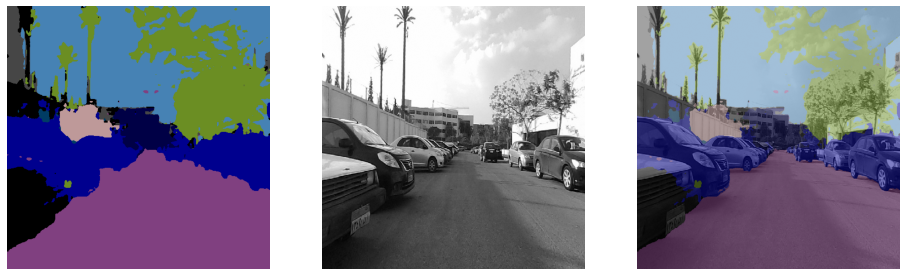

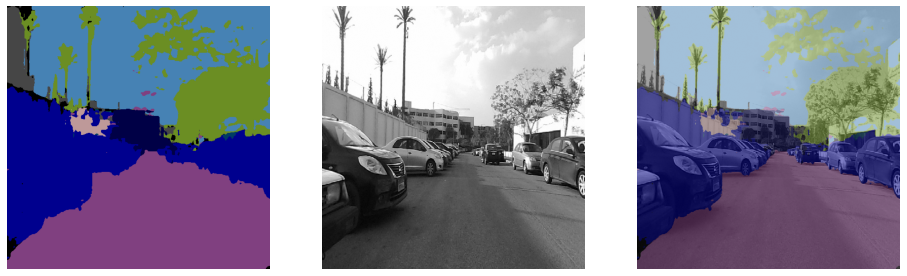

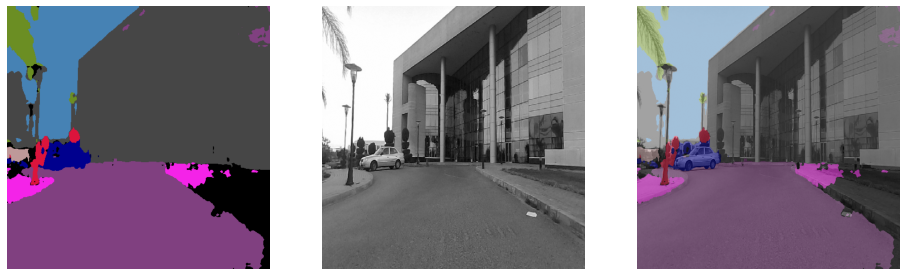

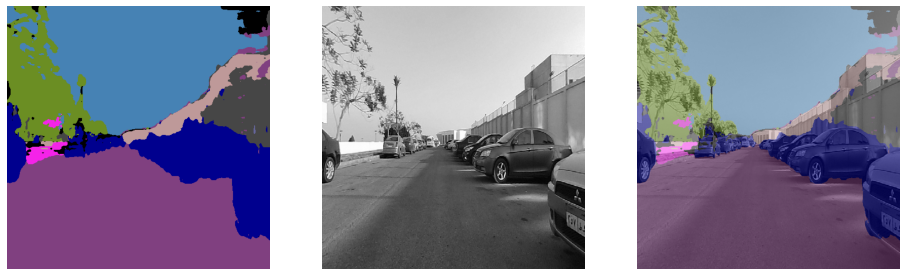

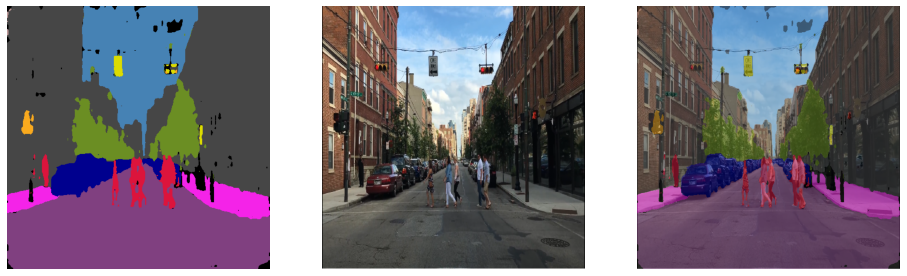

...

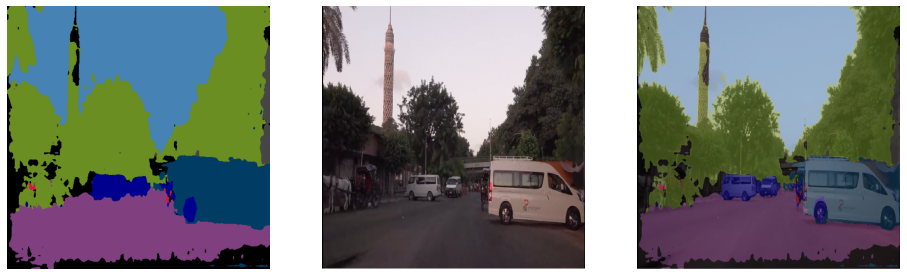

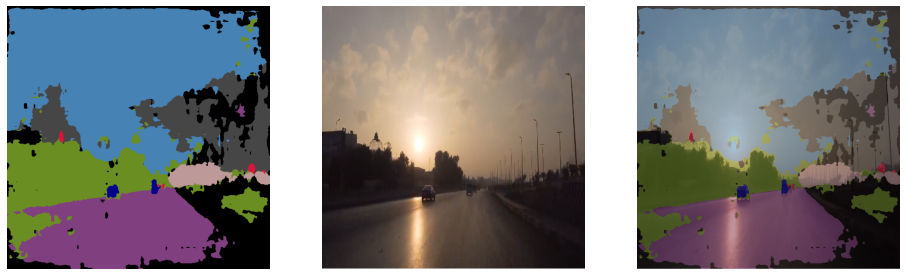

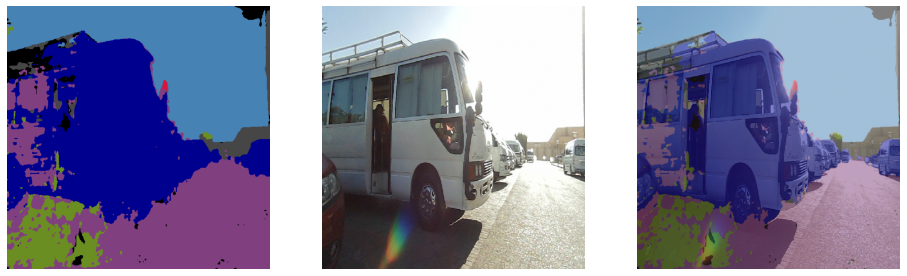

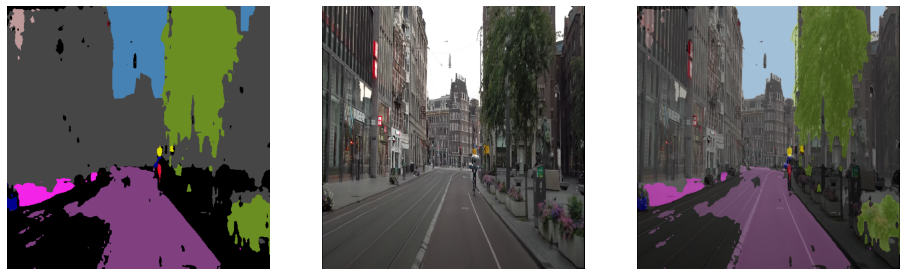

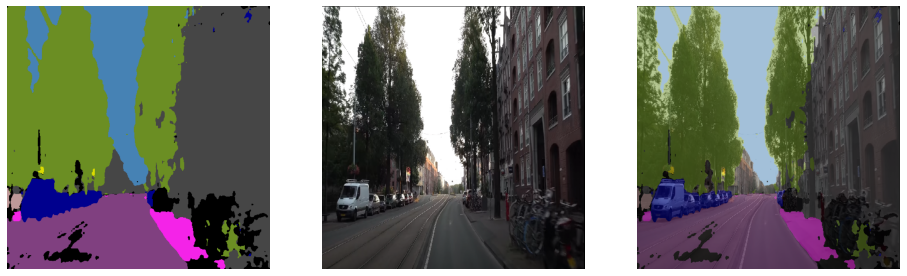

In [14]:
plot_predictions (iti_data_dir,model,DIM,mode='ITI')